## Introduction
###Question of Interest
You have been provided with medical data about multiple patients where each row corresponds to a unique patient. There are 2 files: `heart_train.csv` for training and `heart_test.csv` for testing. Use the data in `heart_train.csv` to train a simple machine learning model that is able to identify if a patient has a high risk of heart attack in the near future in the heart_test.csv file ( 0 = No, 1 = Yes). 



Start by doing Exploratory Data Analysis, finding any interesting insights about the data and then moving on to the modeling. The deliverables will be as follows:
• A Python/R notebook with the code and outputs for EDA, visualizations and the model
• A csv file containing the test data along with the predicted values(0/1)

#### Columns/Features of the Training data
• **Age** : Age of the patient 

• **Sex** : Sex of the patient 

• **exang**: exercise induced angina (1 = yes; 0 = no)

• **ca**: number of major vessels (0-3) 

• **cp** : Chest Pain type chest pain type 

  o Value 1: typical angina 

  o Value 2: atypical angina 

  o Value 3: non-anginal pain 

  o Value 4: asymptomatic 

• **trtbps** : resting blood pressure (in mm Hg) 

• **chol** : cholestoral in mg/dl fetched via BMI sensor 

• **fbs** : (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)

• **rest_ecg** : resting electrocardiographic results o Value 0: normal o Value 1: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV) o Value 2: showing probable or definite left ventricular hypertrophy by Estes' criteria 

• **thalach** : maximum heart rate achieved 

• **target** : 0= no chance of heart attack 1= very high chance of heart attack

## Methods and Results

Initially EDA(Explorary Data Analysis) is done on data to understand the data better. After the data analysis if there is any missing values in the data or correlations between features. This is a binary classfication problem. I will be using logistic regression modelling. First the logistic regression model is trained on the `heart_train.csv`. Model evaluation is done to understand the model. After that it the trained model is used to predict on testing data (`heart_test.csv`)whether the person is at risk of heart attack or not.

## Tools:

For this project is done in google colab. I have installed some dependent libraries for this notebook to work properly.

In [ ]:
#Installing necessary library for pandas-profiling
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
!pip install pandas-profiling
!pip install dtale

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-3.0.0-py2.py3-none-any.whl size=248502 sha256=9bed710ea3d755b981edf1bde3cb04c9c1ed383c87b33cf85edbceffaadf5185
  Stored in directory: /tmp/pip-ephem-wheel-cache-bmy1sb7m/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


Importing the required libraries

In [1]:
#Importing the libraries
import pandas as pd
from pandas_profiling import ProfileReport
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import pickle

Importing the Training data

In [2]:
data=pd.read_csv('/content/drive/MyDrive/heart_train.csv')
data.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


EDA

In [ ]:
data.describe()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
count,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000
mean,54.415493,0.683099,0.971831,131.711268,245.021127,0.154930,0.538732,150.147887,0.320423,1.027465,1.397887,0.728873,2.323944,0.549296
std,9.177283,0.466090,1.032638,17.450214,51.693985,0.362476,0.520172,22.594895,0.467463,1.162375,0.617869,1.026372,0.624011,0.498442
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.000000,0.000000,0.000000,120.000000,210.750000,0.000000,0.000000,136.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,56.000000,1.000000,1.000000,130.000000,239.500000,0.000000,1.000000,154.000000,0.000000,0.650000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,273.250000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


To check out the different datatypes in the data

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284 entries, 0 to 283
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       284 non-null    int64  
 1   sex       284 non-null    int64  
 2   cp        284 non-null    int64  
 3   trtbps    284 non-null    int64  
 4   chol      284 non-null    int64  
 5   fbs       284 non-null    int64  
 6   restecg   284 non-null    int64  
 7   thalachh  284 non-null    int64  
 8   exng      284 non-null    int64  
 9   oldpeak   284 non-null    float64
 10  slp       284 non-null    int64  
 11  caa       284 non-null    int64  
 12  thall     284 non-null    int64  
 13  output    284 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 31.2 KB


In [ ]:
profile = ProfileReport(df=data, title='Heart Data')

In [ ]:
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:410: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the above data exploration I understood that:

1.There are no missing values.

2.'cp' and 'thal' highly correlated with 'output'.

3.Output column is balanced.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


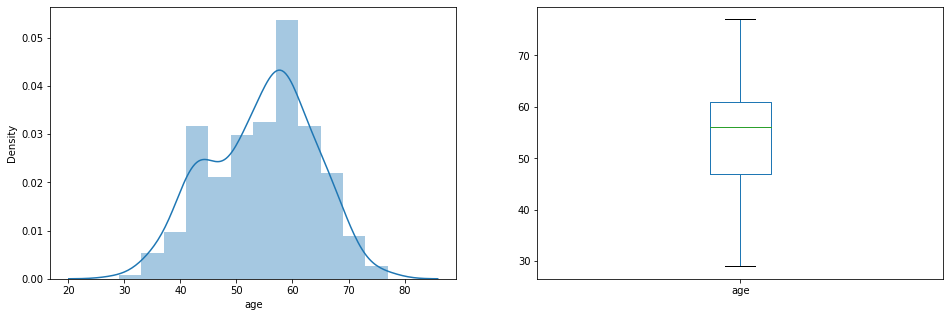

In [7]:
#Age column Analysis

plt.figure(1)
plt.subplot(121)
sns.distplot(data['age']);

plt.subplot(122)
data['age'].plot.box(figsize=(16,5))
plt.show();

On the univariate analysis of age , the data is almost normally distributed and there are no outliers.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


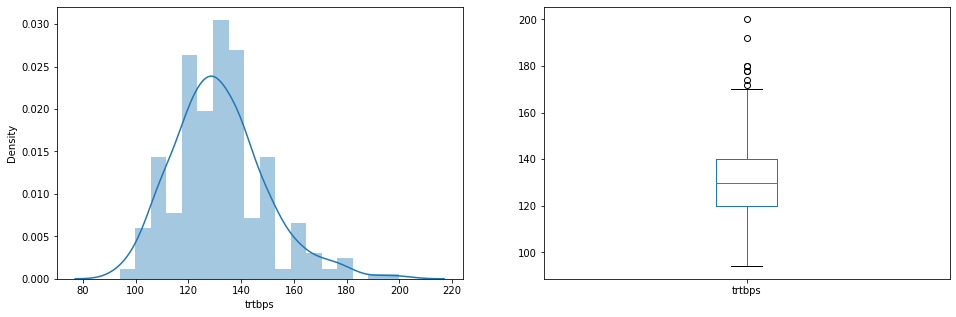

In [8]:
#trtbps	
plt.figure(1)
plt.subplot(121)
sns.distplot(data['trtbps']);

plt.subplot(122)
data['trtbps'].plot.box(figsize=(16,5))
plt.show();

Univariate analysis shows that , the data distribution of the column **trtbps** is not normally distributed because of some outliers in the column

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


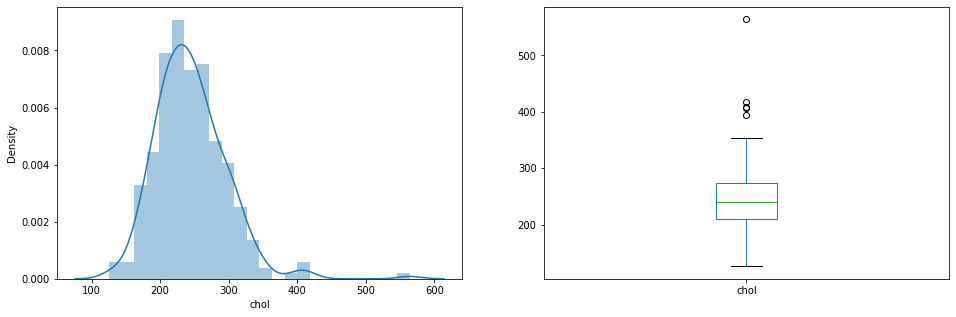

In [9]:
#chol 
plt.figure(1)
plt.subplot(121)
sns.distplot(data['chol']);

plt.subplot(122)
data['chol'].plot.box(figsize=(16,5))
plt.show();

The column **chol** is almost normally distributed but there are some outliers in the data.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


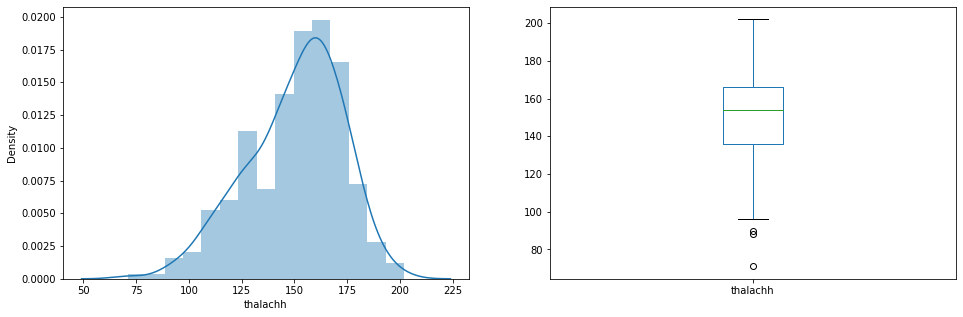

In [10]:
#thalachh	
plt.figure(1)
plt.subplot(121)
sns.distplot(data['thalachh']);

plt.subplot(122)
data['thalachh'].plot.box(figsize=(16,5))
plt.show();

The column **thalachh** is skewed on the left and there are some outliers in the data.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


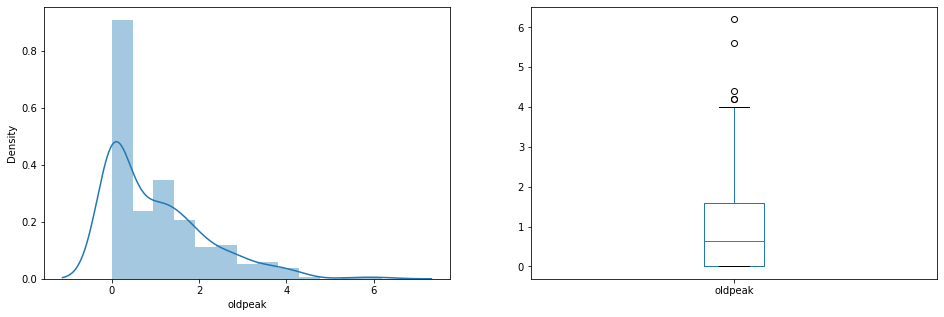

In [11]:
#oldpeak
plt.figure(1)
plt.subplot(121)
sns.distplot(data['oldpeak']);

plt.subplot(122)
data['oldpeak'].plot.box(figsize=(16,5))
plt.show();

The column **oldpeak** is skewed is not normally distributed and there are outliers in the data.

The categorical columns **sex**,**slp**,**fbs**,**restecg**,**exng**,**slp**,	**caa**,	**thall**,	**output** have integer data type. Step below is done to change the datatype from integer to categorical.

In [ ]:
#converting the categorical columns as categorical datatype from integer datatype
data[['sex','cp','fbs','restecg','exng','slp',	'caa',	'thall',	'output']]=data[['sex','cp','fbs','restecg','exng','slp',	'caa',	'thall',	'output']].astype("category")
data.dtypes

age            int64
sex         category
cp          category
trtbps         int64
chol           int64
fbs         category
restecg     category
thalachh       int64
exng        category
oldpeak      float64
slp         category
caa         category
thall       category
output      category
dtype: object

## Modeling

Split the training data to drop the output column from the data. On the next step the training data is split into **X** and **y**. **y** contains the `output` column.

In [14]:
#split the data into X and y
X=data.drop(['output'],axis=1)
y=data[['output']]



Split the columns of the training data `X` on the basis of their datatype such as categorical and numerical columns. Above step is done to apply separate pipeline function to the columns.

In [15]:
#split the data into categorical and numerical columns
cat_feats = X.dtypes[X.dtypes == 'category'].index.tolist()
num_feats = X.dtypes[~X.dtypes.index.isin(cat_feats)].index.tolist()

Split the data into Train and test(validation) data for fitting the model and evaluating the model. The splitting ratio is $80$ : $20$ ie 80 percent is training data nad 20 percent is validation data.

In [16]:
#Train and test split in the ratio of 80:20
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

The numerical columns have to be standardized hence StandardScaler is used on numerical columns
The categorical columns have to be OneHotEncoded using the onehotencoder.

In [ ]:
numeric_transformer = Pipeline([('scaler', StandardScaler())])
categorical_transformer = Pipeline([('Encoder', OneHotEncoder())])

ColumnTransformer is used to transform numerical features and categorical features.

In [ ]:
preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, num_feats),('cat', categorical_transformer, cat_feats)])

In [ ]:
pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('clf', LogisticRegression())])
#Model is trained on X_train and y_train data
pipeline.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Pipeline(memory=None,
         steps=[('preprocess',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('scaler',
                                                                   StandardScaler(copy=True,
                                                                                  with_mean=True,
                                                                                  with_std=True))],
                                                           verbose=False),
                                                  ['age', 'trtbps', 'chol',
                                                   'thalachh', 'oldpeak']),
                                       

###Evaluation of the logistic regression model.

In [ ]:
log_accuracy=pipeline.score(X_test,y_test)
print('Logistic model accuracy:',log_accuracy)

Logistic model accuracy: 0.8421052631578947


### Logistic regression model have an accuracy of 84.21%

## Evaluation

Define the function `evaluation` for evaluating the parameters of the model.

In [ ]:
#Function for the evaluation of the model
def evaluation(y_test,y_pred,X_test,classifier):
  '''This function takes in the 4 arguments and prints the precision,recall,f1 score,classification report 
  and confusion matrix of the model
  
  Input Arguments:
    y_test: Actual output (dataframe)
    y_pred: Predicted output(array)
    X_test: Validation data on which prediction is done(dataframe)
    Classifier:Trained Model(The trained model)
    
  Output: 
    The precision , Recall, F1_score, classification report and confusion matrix is printed'''
  recall=recall_score(y_test, y_pred)
  precision=precision_score(y_test, y_pred)
  f1=f1_score(y_test, y_pred)
  report=classification_report(y_test,y_pred)
  print('Recall Score:',recall)
  print('Precision Score:',precision)
  print('F1 Score:', f1)
  print('Classification Report:')
  print(report)
  plot_confusion_matrix(classifier,X_test, y_test,cmap=plt.cm.Blues)
  plt.show()


`y_predict` is the prediction of the validation data. And evaluation of the model is done.

Recall Score: 0.84375
Precision Score: 0.8709677419354839
F1 Score: 0.8571428571428571
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.84      0.82        25
           1       0.87      0.84      0.86        32

    accuracy                           0.84        57
   macro avg       0.84      0.84      0.84        57
weighted avg       0.84      0.84      0.84        57



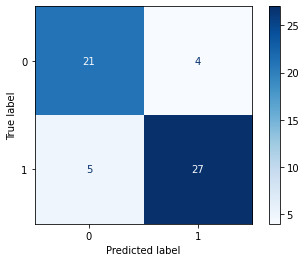

In [ ]:
#Validation data prediction
y_predict=pipeline.predict(X_test)
#The function evaluation is called
evaluation(y_test,y_predict,X_test,pipeline)

F1 score :0.8571428571428571 is pretty good. 

In the classification report we can see that there is a slight class imbalance . Class `1` in output have slight more precision and f1 score than the class`0`. This happened because of the target feature in the training data `output` have slight imbalance in the data.

The model is saved for future use.Pickle library is used for saving the model.

In [ ]:
#save the model
filename = '/content/drive/MyDrive/finalized_lr_model.sav'
pickle.dump(pipeline, open(filename, 'wb'))

Saved model is loaded.

In [17]:
#use the saved model of logistic regression
filename='/content/drive/MyDrive/finalized_lr_model.sav'
#pickled model is loaded into the variable loaded_model
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print('Logistic regression model Accuracy:',result)

Logistic regression model Accuracy: 0.8771929824561403


### Plot the ROC Curve

In [23]:
pred_prob1 = loaded_model.predict_proba(X_test)
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)

In [26]:
# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)


# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
print('AUC Score:',auc_score1)

AUC Score: 0.9565756823821341


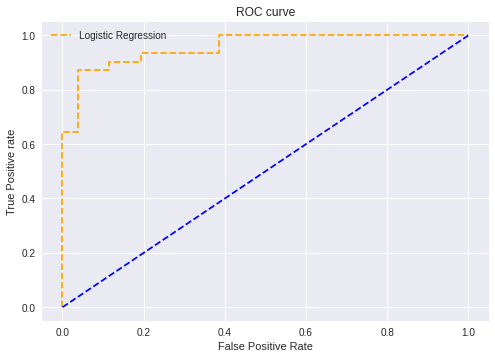

In [25]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

The value of AUC Score being 0.95 which is close to one means that model is perfoming well.

## Test Data

The test data is loaded. To make prediction using the trained model.

In [18]:
#Test Data
test_data=pd.read_csv('/content/drive/MyDrive/heart_test.csv')
test_data.head()


,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall
0,65,0,2,155,269,0,1,148,0,0.8,2,0,2
1,65,0,2,160,360,0,0,151,0,0.8,2,0,2
2,51,0,2,140,308,0,0,142,0,1.5,2,1,2
3,48,1,1,130,245,0,0,180,0,0.2,1,0,2
4,45,1,0,104,208,0,0,148,1,3.0,1,0,2


### Prediction on the `heart_test.csv`

In [20]:
y_final_test=loaded_model.predict(test_data)
y_final_test

array([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [21]:
#Saving the prediction values on test_data
test_data['predicted_heart_attack'] = y_final_test
test_data.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,predicted_heart_attack
0,65,0,2,155,269,0,1,148,0,0.8,2,0,2,1
1,65,0,2,160,360,0,0,151,0,0.8,2,0,2,1
2,51,0,2,140,308,0,0,142,0,1.5,2,1,2,1
3,48,1,1,130,245,0,0,180,0,0.2,1,0,2,1
4,45,1,0,104,208,0,0,148,1,3.0,1,0,2,0


In [27]:
#Save the test_data dataframe to a csv file
test_data.to_csv('/content/drive/MyDrive/submission.csv')

## For future:

Improve the performance of the model.

Try other alogorithms to see if the performance of the model will improve.
